In [1]:
# run "pip install ipython-autotime" in your conda env
%load_ext autotime

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

RANDOM_SEED = 2402

/hps/scratch/lsf_tmpdir/hl-codon-01-02/ipykernel_646404/1468454086.py:4: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


time: 6.7 ms (started: 2022-08-04 16:31:25 +01:00)


In [2]:
import sys
import os
from glob import glob
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd
import copy
import anndata
import matplotlib.pyplot as plt

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

scv.logging.print_version()
scv.set_figure_params()

Running scvelo 0.2.4 (python 3.9.12) on 2022-08-04 16:31.
time: 4.53 s (started: 2022-08-04 16:31:25 +01:00)


ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI's XMLRPC API is currently disabled due to unmanageable load and will be deprecated in the near future. See https://status.python.org/ for more information.


In [3]:
cluster_colours = {
    "Epiblast" : "#635547",
    "Primitive Streak" : "#DABE99",
    "Anterior Primitive Streak" : "#c19f70",
    "Early Nascent Mesoderm" : "#DFCDE4",
    "Late Nascent Mesoderm" : "#C594BF",
    "Head Mesoderm" : "#7E508D",
    "Cardiopharyngeal Mesoderm" : "#B51D8D",
    "Endothelium" : "#ff891c",
    "Posterior PSM 1" : "#6eb8b5",
    "Posterior PSM 2" : "#479b98",
    "Anterior PSM 1" : "#8ac5e3",
    "Anterior PSM 2" : "#459AC0",
    "Somites" : "#006f9e",
    #"Somites" : "#00405c",
    "Mature Somites" : "#00405c",
    #"Mature Somites" : "#00BFC4",
    "Caudal Epiblast" : "#9E6762",
    "NMPs" : "#8EC792",
    "Caudal Neurectoderm" : "#65A83E",
    "Early Spinal Cord" : "#99C463",
    "Late Spinal Cord" : "#CDE088",
    "Early Neurectoderm" : "#649146",
    "Late Neurectoderm" : "#647a4f",
    "Neurons" : "#414f33",
    "Notochord" : "#0F4A9C",
    "Mature Endoderm" : "#EF5A9D",
    "PGCs" : "#FACB12"
}

# the order in which I plot the clusters
cluster_order = [ "Epiblast", "Primitive Streak", "Anterior Primitive Streak", 
                   "Early Nascent Mesoderm", "Late Nascent Mesoderm", "Head Mesoderm", "Cardiopharyngeal Mesoderm", "Endothelium",
                   "Posterior PSM 1", "Posterior PSM 2", "Anterior PSM 1", "Anterior PSM 2", "Somites", "Mature Somites",
                   "Caudal Epiblast", "NMPs", "Caudal Neurectoderm", "Early Spinal Cord", "Late Spinal Cord",
                   "Early Neurectoderm", "Late Neurectoderm", "Neurons",
                   "Notochord", "Mature Endoderm", "PGCs" ]

# gastruloid timepoint colours
timepoint_colours = { "d3" : "#cd1400",
                       "d3_d3.5" : "#DA4800",
                       "d3.5" : "#E67D00",
                       "d3.5_d4" : "#EEA416",
                       "d4" : "#f6ca2b",
                       "d4_d4.5" : "#BEBC50",
                       "d4.5" : "#85ad76",
                       "d4.5_d5" : "#699D95",
                       "d5" : "#4d8db4"
                      }

time: 1.18 ms (started: 2022-08-04 16:31:29 +01:00)


# OPTIONAL

In [ ]:
indir = '/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/cellranger_outs/'
adata = sc.read_h5ad("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/seurat_final.h5ad")

In [5]:
outfile = '/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/velocyto_out_combined.loom'
ldata = scv.read(outfile, cache=False)
ldata

AnnData object with n_obs × n_vars = 120924 × 26920
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'symbol'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

time: 48min 37s (started: 2022-04-26 11:20:35 +01:00)


In [6]:
meso = {'d3': ['Bar2_exp4_d3', 'Bar14_exp4_d3', 'Bar65_exp4_d3', 'Bar61_exp4_d3', 'Bar19_exp4_d3', 'Bar13_exp4_d3', 'Bar55_exp4_d3', 'Bar15_exp4_d3'],
        'd3.5': ['Bar28_exp5_d3.5_d4', 'Bar56_exp5_d3.5_d4', 'Bar65_exp5_d3.5_d4', 'Bar55_exp5_d3.5_d4', 'Bar49_exp5_d3.5_d4', 'Bar61_exp5_d3.5_d4'],
        'd4': ['Bar21_exp5_d3.5_d4', 'Bar28_exp3B_d4_d4.5', 'Bar12_exp3B_d4_d4.5', 'Bar12_exp5_d3.5_d4', 
               'Bar4_exp5_d3.5_d4', 'Bar17_exp5_d3.5_d4', 'Bar55_exp3B_d4_d4.5', 'Bar18_exp5_d3.5_d4', 
               'Bar56_exp3B_d4_d4.5', 'Bar10_exp5_d3.5_d4', 'Bar14_exp5_d3.5_d4', 'Bar13_exp5_d3.5_d4',
               'Bar52_exp3B_d4_d4.5', 'Bar2_exp5_d3.5_d4', 'Bar6_exp5_d3.5_d4', 'Bar7_exp5_d3.5_d4',
               'Bar1_exp5_d3.5_d4', 'Bar5_exp3B_d4_d4.5', 'Bar15_exp5_d3.5_d4', 'Bar30_exp3B_d4_d4.5',
               'Bar19_exp5_d3.5_d4', 'Bar6_exp3B_d4_d4.5'],
        'd4.5': ['Bar66_exp6_d4.5_d5', 'Bar45_exp3B_d4_d4.5', 'Bar61_exp6_d4.5_d5', 'Bar14_exp3B_d4_d4.5', 'Bar39_exp3B_d4_d4.5', 'Bar49_exp6_d4.5_d5',
                 'Bar66_exp3B_d4_d4.5', 'Bar41_exp6_d4.5_d5', 'Bar52_exp6_d4.5_d5', 'Bar47_exp6_d4.5_d5', 'Bar59_exp3B_d4_d4.5', 'Bar24_exp6_d4.5_d5',
                 'Bar59_exp6_d4.5_d5', 'Bar65_exp3B_d4_d4.5', 'Bar41_exp3B_d4_d4.5', 'Bar30_exp6_d4.5_d5'],
        'd5': ['Bar1_exp1_d5', 'Bar17_exp6_d4.5_d5', 'Bar21_exp1_d5', 'Bar20_exp6_d4.5_d5', 'Bar8_exp1_d5', 'Bar6_exp6_d4.5_d5', 'Bar4_exp6_d4.5_d5',
               'Bar23_exp1_d5', 'Bar18_exp6_d4.5_d5', 'Bar15_exp6_d4.5_d5', 'Bar11_exp1_d5', 'Bar9_exp1_d5', 'Bar6_exp1_d5']
       }
neural = {'d3': ['Bar45_exp4_d3', 'Bar20_exp4_d3', 'Bar49_exp4_d3', 'Bar28_exp4_d3', 'Bar66_exp4_d3', 'Bar56_exp4_d3', 'Bar52_exp4_d3',
                 'Bar59_exp4_d3', 'Bar41_exp4_d3', 'Bar47_exp4_d3', 'Bar30_exp4_d3', 'Bar25_exp4_d3'],
          'd3.5': ['Bar30_exp5_d3.5_d4', 'Bar47_exp5_d3.5_d4', 'Bar59_exp5_d3.5_d4', 'Bar24_exp5_d3.5_d4', 'Bar25_exp5_d3.5_d4', 'Bar41_exp5_d3.5_d4',
                   'Bar52_exp5_d3.5_d4', 'Bar45_exp5_d3.5_d4', 'Bar23_exp5_d3.5_d4', 'Bar66_exp5_d3.5_d4'],
          'd4': ['Bar22_exp3B_d4_d4.5', 'Bar22_exp5_d3.5_d4', 'Bar25_exp3B_d4_d4.5', 'Bar20_exp5_d3.5_d4',
                 'Bar2_exp3B_d4_d4.5', 'Bar49_exp3B_d4_d4.5'],
          'd4.5': ['Bar65_exp6_d4.5_d5', 'Bar28_exp6_d4.5_d5', 'Bar45_exp6_d4.5_d5', 'Bar47_exp3B_d4_d4.5', 'Bar19_exp3B_d4_d4.5', 'Bar15_exp3B_d4_d4.5',
                   'Bar13_exp3B_d4_d4.5', 'Bar23_exp6_d4.5_d5', 'Bar55_exp6_d4.5_d5', 'Bar61_exp3B_d4_d4.5', 'Bar25_exp6_d4.5_d5', 'Bar56_exp6_d4.5_d5'],
          'd5': ['Bar17_exp1_d5', 'Bar3_exp1_d5', 'Bar10_exp6_d4.5_d5', 'Bar21_exp6_d4.5_d5', 'Bar2_exp6_d4.5_d5', 'Bar22_exp1_d5', 'Bar12_exp1_d5', 'Bar15_exp1_d5',
                 'Bar13_exp1_d5', 'Bar7_exp6_d4.5_d5', 'Bar4_exp1_d5', 'Bar16_exp1_d5']
         }

intermediate = {'d5': ['Bar10_exp1_d5', 'Bar12_exp6_d4.5_d5', 'Bar13_exp6_d4.5_d5', 'Bar14_exp1_d5', 'Bar14_exp6_d4.5_d5', 'Bar17_exp1_d5',
                       'Bar18_exp1_d5', 'Bar19_exp1_d5', 'Bar19_exp6_d4.5_d5', 'Bar1_exp6_d4.5_d5', 'Bar20_exp1_d5', 'Bar22_exp6_d4.5_d5',
                       'Bar24_exp1_d5', 'Bar2_exp1_d5', 'Bar5_exp1_d5', 'Bar7_exp1_d5']}

time: 2.37 ms (started: 2022-04-26 12:09:13 +01:00)


In [7]:
adata_merge = scv.utils.merge(adata, ldata)
adata_merge = adata_merge[adata_merge.obs.MULTI_class.isin([item for sublist in list(neural.values()) for item in sublist]) & \
                          adata_merge.obs.timepoint.isin(['d3', 'd3.5', 'd4', 'd4.5', 'd5'])
                          ,
                          adata_merge.var[adata_merge.var.cc_gene==0].index.values
                         ]

time: 17min 8s (started: 2022-04-26 12:09:13 +01:00)


In [8]:
adata_merge

View of AnnData object with n_obs × n_vars = 14964 × 24384
    obs: 'cell', 'X1', 'X2', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'barcode', 'experiment', 'timepoint', 'organoid', 'tech', 'class', 'lane', 'batch', 'percent.mt', 'percent.ribo', 'ident', 'cxds_score', 'cxds_call', 'bcds_score', 'bcds_call', 'hybrid_score', 'hybrid_call', 'pass_QC', 'hybrid_map', 'hybrid_call2', 'S.Score', 'G2M.Score', 'Phase', 'MULTI_class', 'timepoint.base', 'sample', 'timepoint.demultiplexed', 'RNA_snn_res.0.6', 'seurat_clusters', 'cluster', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'ens_id', 'symbol', 'cc_gene', 'gastr_only_hvg', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'neighbors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances'

time: 5.23 ms (started: 2022-04-26 12:26:21 +01:00)


In [9]:
adata_merge.obs['cluster'] = adata_merge.obs.cluster.astype('category')
adata_merge.obs['Phase'] = adata_merge.obs.Phase.astype('category')
adata_merge.obs['experiment'] = adata_merge.obs.experiment.astype('category')
adata_merge.obs['timepoint'] = adata_merge.obs.timepoint.astype('category')

/hps/scratch/lsf_tmpdir/hl-codon-18-02/ipykernel_1922207/2216502945.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_merge.obs['cluster'] = adata_merge.obs.cluster.astype('category')


time: 28.5 s (started: 2022-04-26 12:26:21 +01:00)


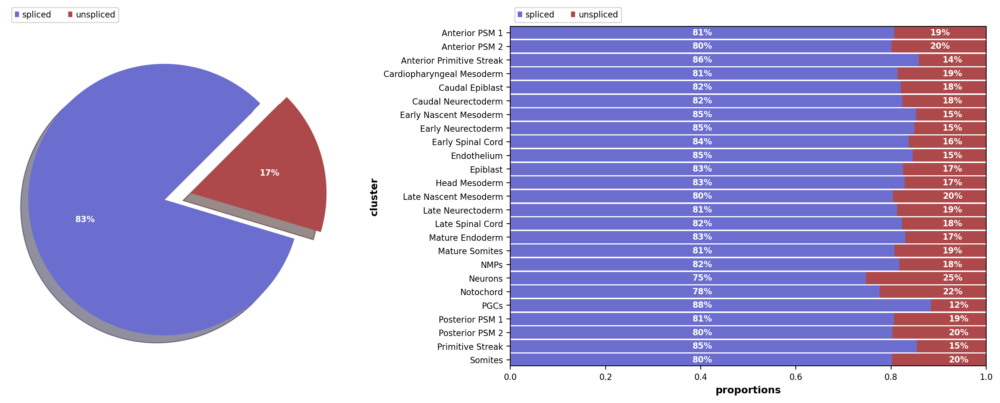

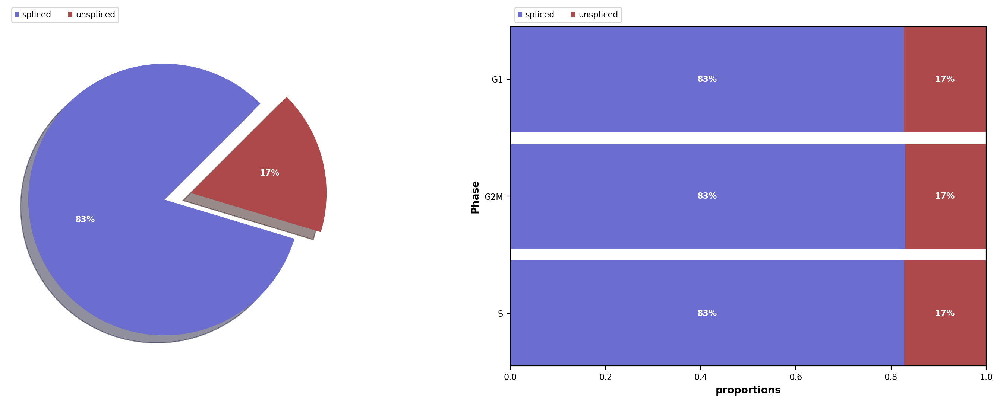

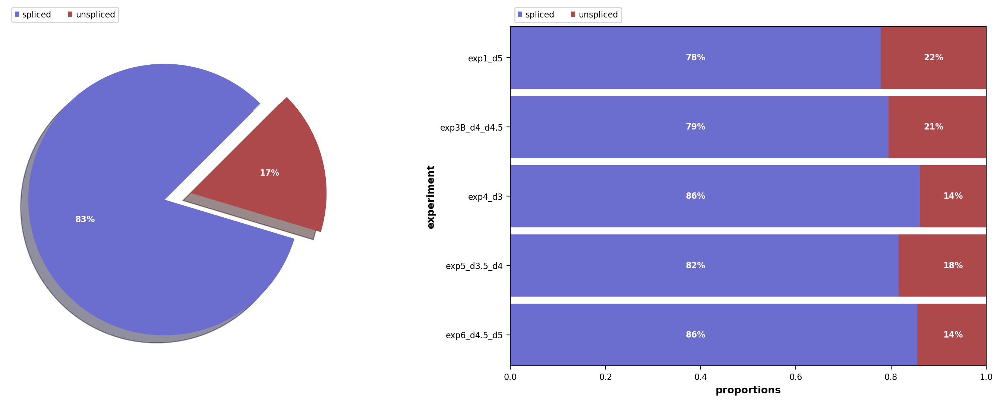

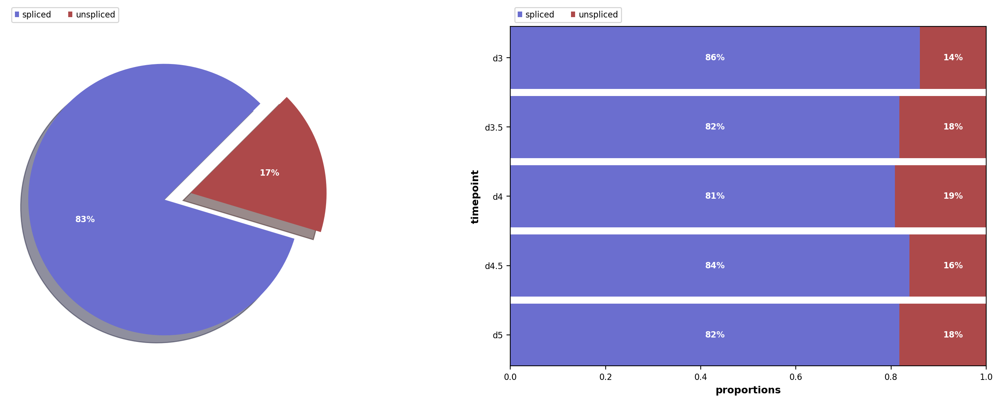

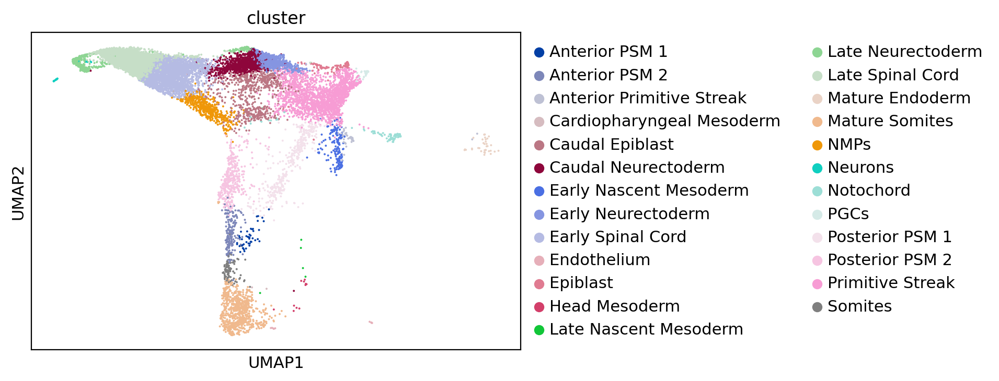

time: 6.55 s (started: 2022-04-26 12:26:50 +01:00)


In [10]:
scv.pl.proportions(adata_merge, groupby='cluster', figsize=(18,6))
scv.pl.proportions(adata_merge, groupby='Phase', figsize=(18,6))
scv.pl.proportions(adata_merge, groupby='experiment', figsize=(18,6))
scv.pl.proportions(adata_merge, groupby='timepoint', figsize=(18,6))

sc.pl.umap(adata_merge, color="cluster")

In [11]:
# Preprocess the Data
scv.pp.filter_and_normalize(adata_merge, n_top_genes=2000, min_shared_counts=20)
adata_merge.X = np.array(adata_merge.X.todense())
scv.pp.neighbors(adata_merge, n_pcs=50, n_neighbors=30, use_rep='X_pca')
scv.pp.moments(adata_merge, n_pcs=50, n_neighbors=30, use_rep='X_pca')

Filtered out 13606 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Extracted 2000 highly variable genes.
computing neighbors
    finished (0:00:15) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
time: 3min 55s (started: 2022-04-26 12:26:56 +01:00)


# RERUN SCVELO HERE

In [4]:
#del ldata, adata
#adata_merge.write("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/anndata_neural_scv_preprocssed.h5ad.gz", compression="gzip")
adata_merge = sc.read_h5ad("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/anndata_neural_scv_preprocssed.h5ad.gz")
adata_merge

AnnData object with n_obs × n_vars = 14964 × 2000
    obs: 'cell', 'X1', 'X2', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'barcode', 'experiment', 'timepoint', 'organoid', 'tech', 'class', 'lane', 'batch', 'percent.mt', 'percent.ribo', 'ident', 'cxds_score', 'cxds_call', 'bcds_score', 'bcds_call', 'hybrid_score', 'hybrid_call', 'pass_QC', 'hybrid_map', 'hybrid_call2', 'S.Score', 'G2M.Score', 'Phase', 'MULTI_class', 'timepoint.base', 'sample', 'timepoint.demultiplexed', 'RNA_snn_res.0.6', 'seurat_clusters', 'cluster', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'ens_id', 'symbol', 'cc_gene', 'gastr_only_hvg', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'cluster_colors', 'neighbors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

time: 13.4 s (started: 2022-07-19 12:53:15 +01:00)


In [5]:
#scv.tl.recover_dynamics(adata_merge, n_jobs=8)
scv.tl.velocity(adata_merge, mode="deterministic")
#scv.tl.velocity(adata_merge, mode="dynamic")
#scv.tl.velocity_graph(adata_merge)
scv.tl.velocity_graph(adata_merge, approx=False, n_jobs=8)

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 8/96 cores)


  0%|          | 0/14964 [00:00<?, ?cells/s]

/nfs/research/marioni/Leah/software/conda_envs/cellrank/lib/python3.9/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:14) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
time: 16.1 s (started: 2022-07-19 12:53:30 +01:00)


computing velocity embedding
    finished (0:00:03) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


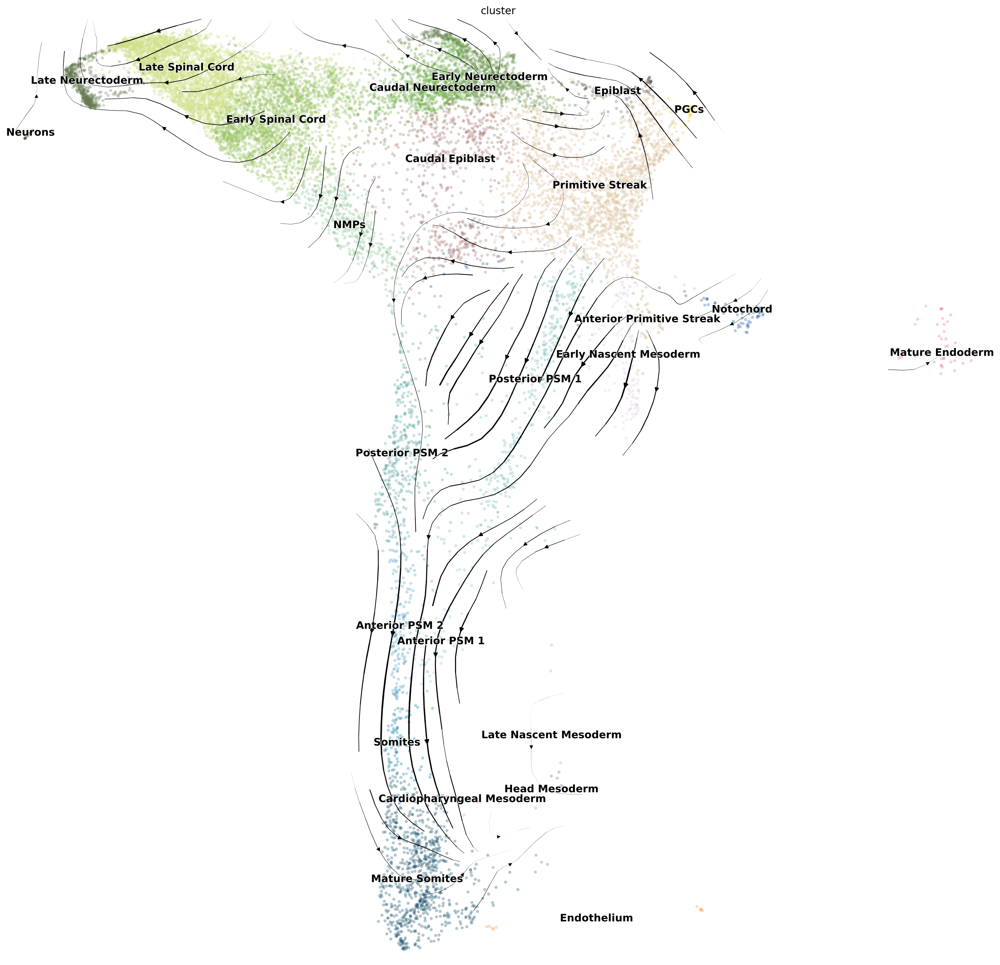

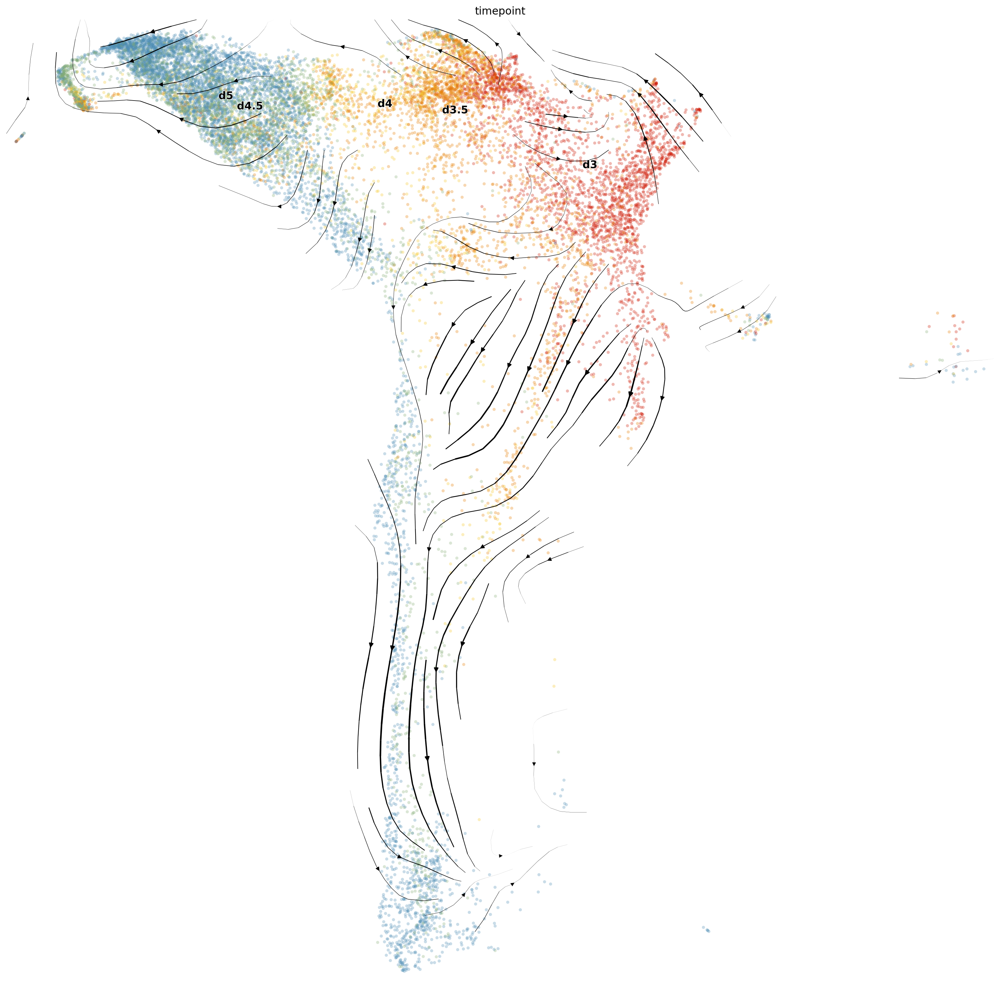

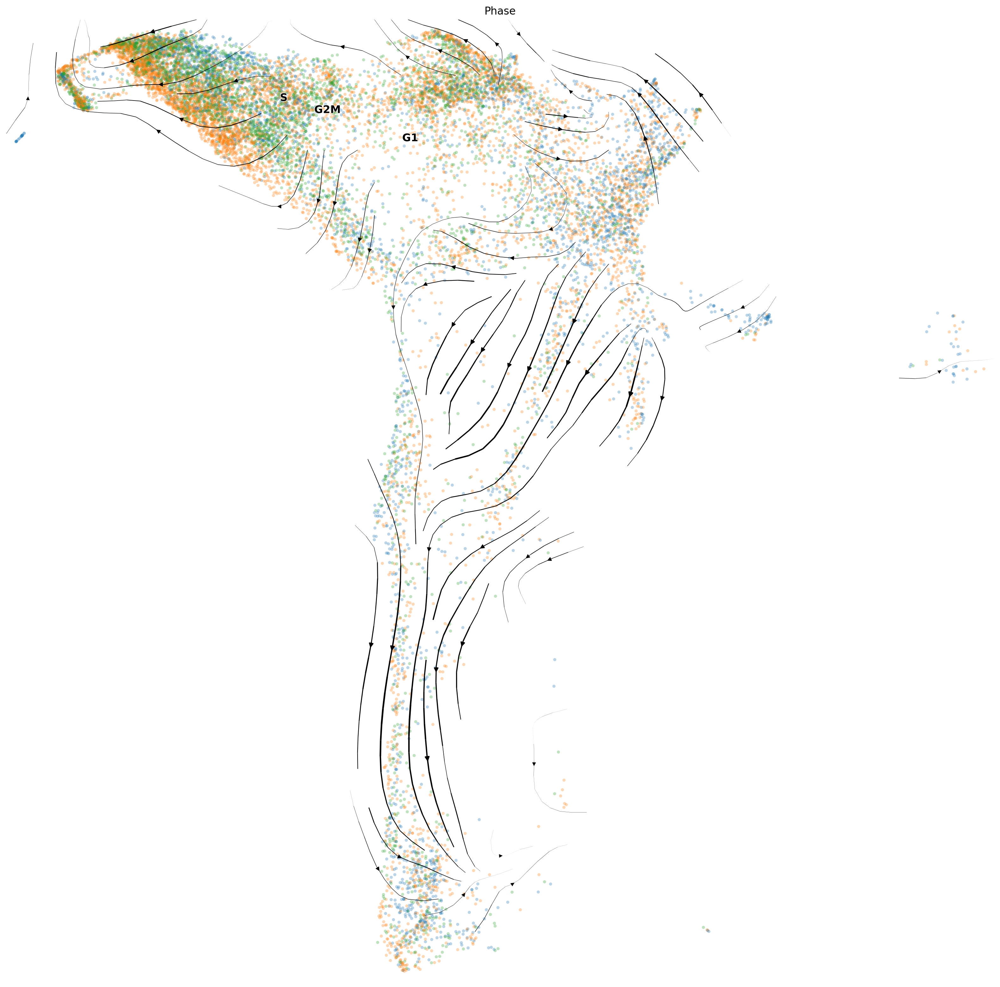

computing terminal states
    identified 9 regions of root cells and 2 regions of end points .
    finished (0:00:06) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


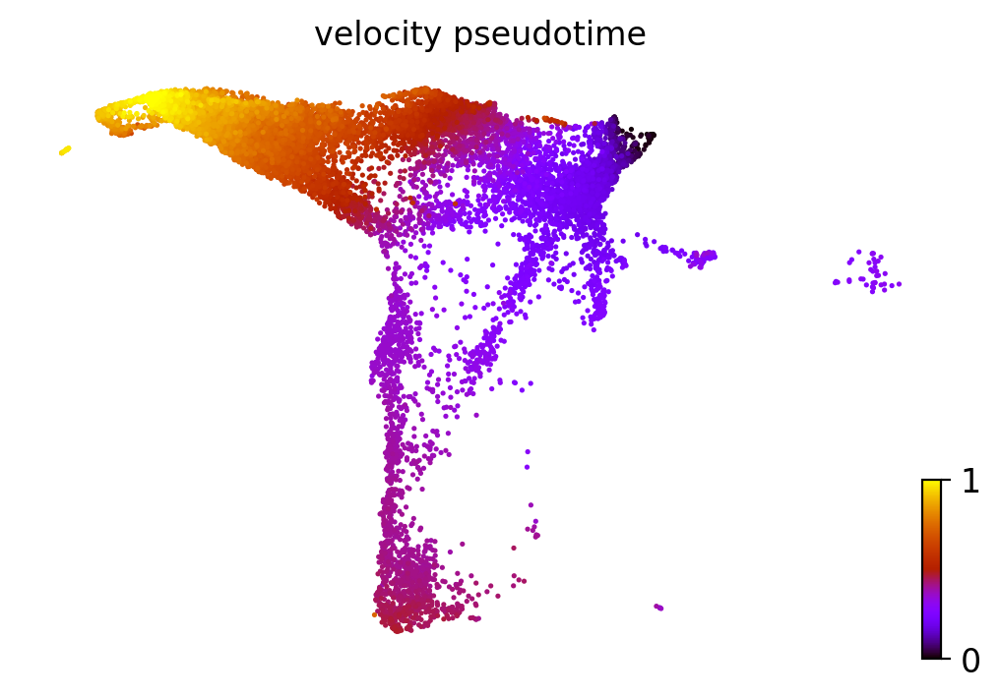

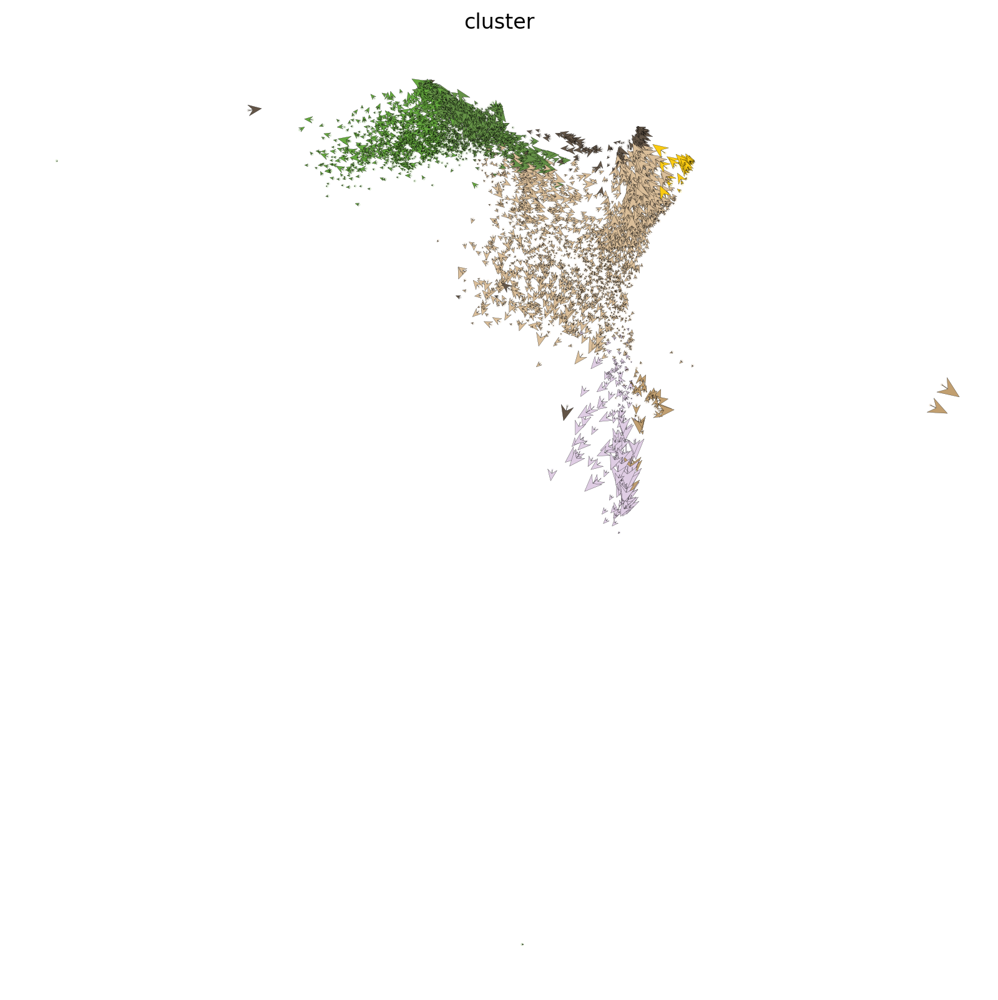

time: 21.4 s (started: 2022-07-19 12:53:46 +01:00)


In [6]:
## Plots for manuscript
#adata_merge = sc.read('adata_dynamical_approx_top3000.h5',cache=True)

colPalette_celltype = [cluster_colours[i] for i in sorted(np.unique(adata_merge.obs['cluster']))]
adata_merge.uns['cluster_colors'] = colPalette_celltype

colPalette_stage = [timepoint_colours[i] for i in sorted(np.unique(adata_merge.obs['timepoint']))]
adata_merge.uns['timepoint_colors'] = colPalette_stage

fig, axs = plt.subplots(1,1, figsize = (20,20))

scv.pl.velocity_embedding_stream(adata_merge, basis="umap", color="cluster", size=50, ax = axs)

fig, axs = plt.subplots(1,1, figsize = (20,20))

scv.pl.velocity_embedding_stream(adata_merge, basis="umap", color="timepoint", size=50, ax = axs)

fig, axs = plt.subplots(1,1, figsize = (20,20))

scv.pl.velocity_embedding_stream(adata_merge, basis="umap", color="Phase", size=50, ax = axs)

scv.tl.velocity_pseudotime(adata_merge)

scv.pl.scatter(adata_merge, color='velocity_pseudotime', cmap='gnuplot')

fig, axs = plt.subplots(1,1, figsize = (10,10))
base_celltypes = ['Epiblast', 'Primitive Streak', 'Anterior Primitive Streak', 'Early Nascent Mesoderm',
                  'PGCs', 'Caudal Neurectoderm', 'Early Neurectoderm'
                 ]
#base_celltypes = ['Epiblast', 'Primitive Streak']
scv.pl.velocity_embedding(adata_merge[adata_merge.obs['cluster'].isin(base_celltypes).values],
                          basis="umap", color="cluster", arrow_length=6, arrow_size=4, ax = axs
                         )
scv.pl.velocity_embedding(adata_merge[adata_merge.obs['cluster'].isin(base_celltypes).values],
                          basis="umap", color="Phase", arrow_length=6, arrow_size=4, ax = axs
                         )

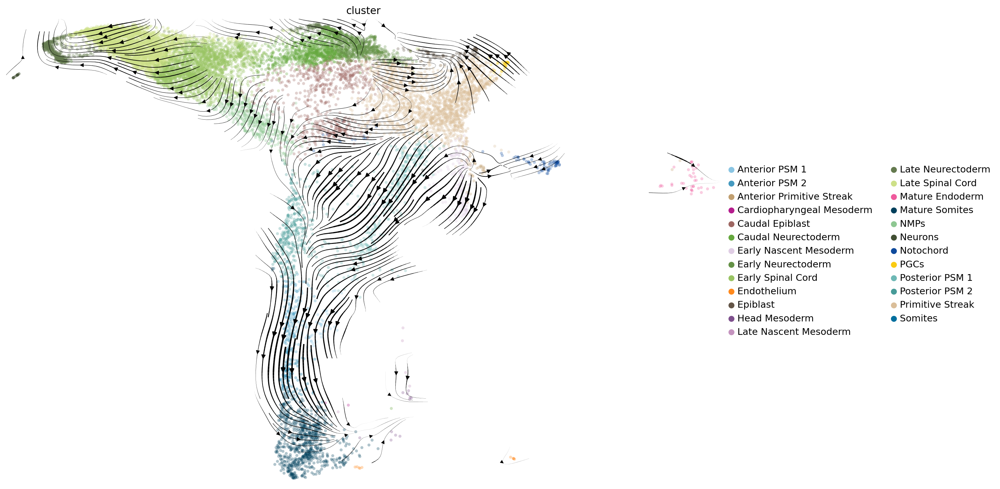

time: 7.94 s (started: 2022-07-19 12:54:08 +01:00)


In [7]:
fig, axs = plt.subplots(1,1, figsize = (15,10))

scv.pl.velocity_embedding_stream(adata_merge, basis="umap", color="cluster", size=50, ax = axs, density=5, legend_loc="right")

In [4]:
#adata_merge.write("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/anndata_neural_scv_determ.h5ad.gz", compression="gzip")
adata_merge = sc.read_h5ad("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/anndata_neural_scv_dynam.h5ad.gz")

adata_merge = adata_merge[adata_merge.obs.timepoint.isin(['d3', 'd3.5', 'd4', 'd4.5', 'd5']),]
adata_merge.var_names = adata_merge.var.symbol.astype(str)
adata_merge.obs["day"] = [float(tp[1:]) for tp in adata_merge.obs.timepoint]

time: 15.7 s (started: 2022-08-04 16:31:35 +01:00)


In [5]:
adata_merge.var.to_csv('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/scVelo_neural2000genes.csv')

time: 87.2 ms (started: 2022-07-18 19:53:13 +01:00)


# RERUN CELLRANK HERE

## Calculate Individual Kernels

### Velocity Kernel

In [5]:
from cellrank.tl.kernels import VelocityKernel

vk = VelocityKernel(adata_merge).compute_transition_matrix()

Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/14964 [00:00<?, ?cell/s]

Setting `softmax_scale=3.3843`


  0%|          | 0/14964 [00:00<?, ?cell/s]

    Finish (0:00:40)
time: 41 s (started: 2022-08-04 16:31:51 +01:00)


### Connectivity Kernel

In [6]:
from cellrank.tl.kernels import ConnectivityKernel

ck = ConnectivityKernel(adata_merge).compute_transition_matrix()

Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
time: 64.5 ms (started: 2022-08-04 16:32:32 +01:00)


### WOT Kernel

In [7]:
from cellrank.external.kernels import WOTKernel

wk = WOTKernel(adata_merge, time_key="day")

time: 11.9 ms (started: 2022-08-04 16:32:32 +01:00)


In [8]:
from cellrank.external.kernels._utils import MarkerGenes

proliferation_markers_symbols = getattr(MarkerGenes, "proliferation_markers")("mouse")
proliferation_markers_symbols = ["Pimreg" if x == "Fam64a" else x for x in proliferation_markers_symbols]
proliferation_markers_symbols = ["Cenpu" if x == "Mlf1ip" else x for x in proliferation_markers_symbols]
proliferation_markers_symbols = ["Jpt1" if x == "Hn1" else x for x in proliferation_markers_symbols]
proliferation_markers = [adata_merge.raw.var.ens_id.values[adata_merge.raw.var.symbol==gs][0] for gs in proliferation_markers_symbols]

apoptosis_markers_symbols = getattr(MarkerGenes, "apoptosis_markers")("mouse")
apoptosis_markers_symbols = ["Coq8a" if x == "Adck3" else x for x in apoptosis_markers_symbols]
apoptosis_markers_symbols = ["Rack1" if x == "Gnb2l1" else x for x in apoptosis_markers_symbols]
apoptosis_markers = [adata_merge.raw.var.ens_id.values[adata_merge.raw.var.symbol==gs][0] for gs in apoptosis_markers_symbols]

time: 50.7 ms (started: 2022-08-04 16:32:32 +01:00)


In [9]:
sc.tl.score_genes(adata_merge,
                   gene_list=proliferation_markers,
                   score_name="proliferation_score",
                   use_raw=True
                  )

sc.tl.score_genes(adata_merge,
                   gene_list=apoptosis_markers,
                   score_name="apoptosis_score",
                   use_raw=True
                  )

time: 3.83 s (started: 2022-08-04 16:32:32 +01:00)


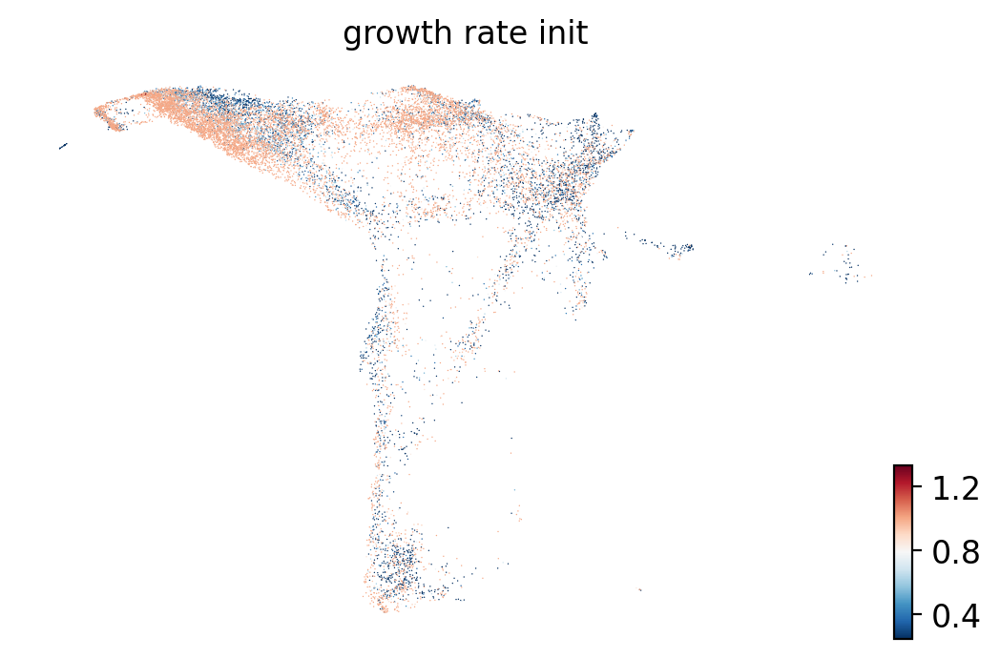

time: 411 ms (started: 2022-08-04 16:32:36 +01:00)


In [10]:
wk.compute_initial_growth_rates(proliferation_key="proliferation_score", apoptosis_key="apoptosis_score", use_raw=True, key_added="growth_rate_init")
scv.pl.scatter(
    adata_merge, c="growth_rate_init", legend_loc="right", basis="umap", s=1
)

In [11]:
wk.compute_transition_matrix(
    growth_iters=10, growth_rate_key="growth_rate_init", last_time_point="connectivities"
)

Computing transition matrix using Waddington optimal transport
Using `2000` HVGs from `adata.var['highly_variable']`
Using default cost matrices
Computing transport maps for `4` time pairs


  0%|          | 0/4 [00:00<?, ?time pair/s]

    Finish (0:09:54)
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Using `threshold=0.003009065753559124`
    Finish (0:10:07)


<WOTKernel>

time: 10min 7s (started: 2022-08-04 16:32:36 +01:00)


In [13]:
import scipy.io
scipy.io.mmwrite('wk_transmat_neuro.mtx', wk.transition_matrix)
np.savetxt('wk_transmap_3_35_neuro.csv', wk.transport_maps[(3.0,3.5)].X, delimiter=',')
np.savetxt('wk_transmap_35_4_neuro.csv', wk.transport_maps[(3.5,4.0)].X, delimiter=',')
np.savetxt('wk_transmap_4_45_neuro.csv', wk.transport_maps[(4.0,4.5)].X, delimiter=',')
np.savetxt('wk_transmap_45_5_neuro.csv', wk.transport_maps[(4.5,5.0)].X, delimiter=',')
scipy.io.mmwrite('vk_transmat_neuro.mtx', vk.transition_matrix)
scipy.io.mmwrite('ck_transmat_neuro.mtx', ck.transition_matrix)
wk.adata.obs.to_csv('wk_obs_neuro.csv', header=True)
wk.transport_maps[(3.0,3.5)].obs.to_csv('wk_transmap_3_35_obs_neuro.csv', header=True)
wk.transport_maps[(3.5,4.0)].obs.to_csv('wk_transmap_35_4_obs_neuro.csv', header=True)
wk.transport_maps[(4.0,4.5)].obs.to_csv('wk_transmap_4_45_obs_neuro.csv', header=True)
wk.transport_maps[(4.5,5.0)].obs.to_csv('wk_transmap_45_5_obs_neuro.csv', header=True)
vk.adata.obs.to_csv('vk_obs_neuro.csv', header=True)
ck.adata.obs.to_csv('ck_obs_neuro.csv', header=True)
wk.transport_maps[(3.0,3.5)].var.to_csv('wk_transmap_3_35_var_neuro.csv', header=False)
wk.transport_maps[(3.5,4.0)].var.to_csv('wk_transmap_35_4_var_neuro.csv', header=False)
wk.transport_maps[(4.0,4.5)].var.to_csv('wk_transmap_4_45_var_neuro.csv', header=False)
wk.transport_maps[(4.5,5.0)].var.to_csv('wk_transmap_45_5_var_neuro.csv', header=False)

time: 35.7 s (started: 2022-07-18 20:02:10 +01:00)


## Combine Kernels

Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
9.9999999999999800e-01 -1.4984774997982343e-03 2.3730864604900162e-02 -2.4473366789003002e-02 -9.5348600856402736e-03 -6.2826361162702385e-03 -5.5576728807587329e-03 -3.7569038014409493e-02 4.7045124845621986e-03 4.5850174444519226e-03 -6.2585685539229718e-02 -2.8031880320294623e-03 3.2932705399047243e-03 6.9142678758889714e-02 -4.9979372177985010e-02 -7.9047006091337399e-02 5.3595150594553921e-02 -6.8539018000352021e-03 -1.4612986851500809e-02 5.3096141683798413e-02 1.8809482523679245e-02 
0.0000000000000000e+00 9.9847622154391069e-01 -1.9518954748182431e-02 -2.0996447624912443e-02 -2.5439981552691841e-02 9.6402836164198990e-03 -1.5088361365282851e-03 1.5765229727822037e-02 4.6569695359088776e-03 3.2962046152089974e-02 -2.9275897619561023e-02 -2.0885579946395536e-02 1.6443034161729698e-02 -2.3594926849951414e-02 -1.1320492173459389e-02 5.3161428676109325e-02 -4.8753505896627865e-02 1.7591478956660567e-02 3.5106

Mat Object: 1 MPI processes
  type: seqdense
9.9999999999999778e-01 -1.4984774998001423e-03 2.4473366788990276e-02 -2.3730864604912472e-02 9.5348600856431653e-03 6.2826361162697311e-03 5.5576728807609317e-03 3.7569038014405969e-02 4.7045124845827924e-03 4.5850174444503804e-03 6.2585685539228747e-02 -2.8031880320335623e-03 3.2932705399200519e-03 -6.9142678758884080e-02 4.9979372178005736e-02 -7.9047006091343186e-02 5.3595150594541147e-02 1.4612986851486270e-02 6.8539018000224033e-03 -5.3096141683802854e-02 -1.8809482523682895e-02 
0.0000000000000000e+00 9.9847622154391213e-01 2.0996447624916769e-02 1.9518954748173313e-02 2.5439981552693926e-02 -9.6402836164184314e-03 1.5088361365244404e-03 -1.5765229727818908e-02 4.6569695359032545e-03 3.2962046152091272e-02 2.9275897619555406e-02 -2.0885579946409643e-02 1.6443034161726103e-02 2.3594926849945824e-02 1.1320492173444826e-02 5.3161428676111663e-02 -4.8753505896609900e-02 -3.5106258414933450e-02 -1.7591478956662375e-02 3.6504315927521971e-0

When computing macrostates, choose a number of states NOT in `[3, 8, 11, 15, 18, 20]`
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:10)


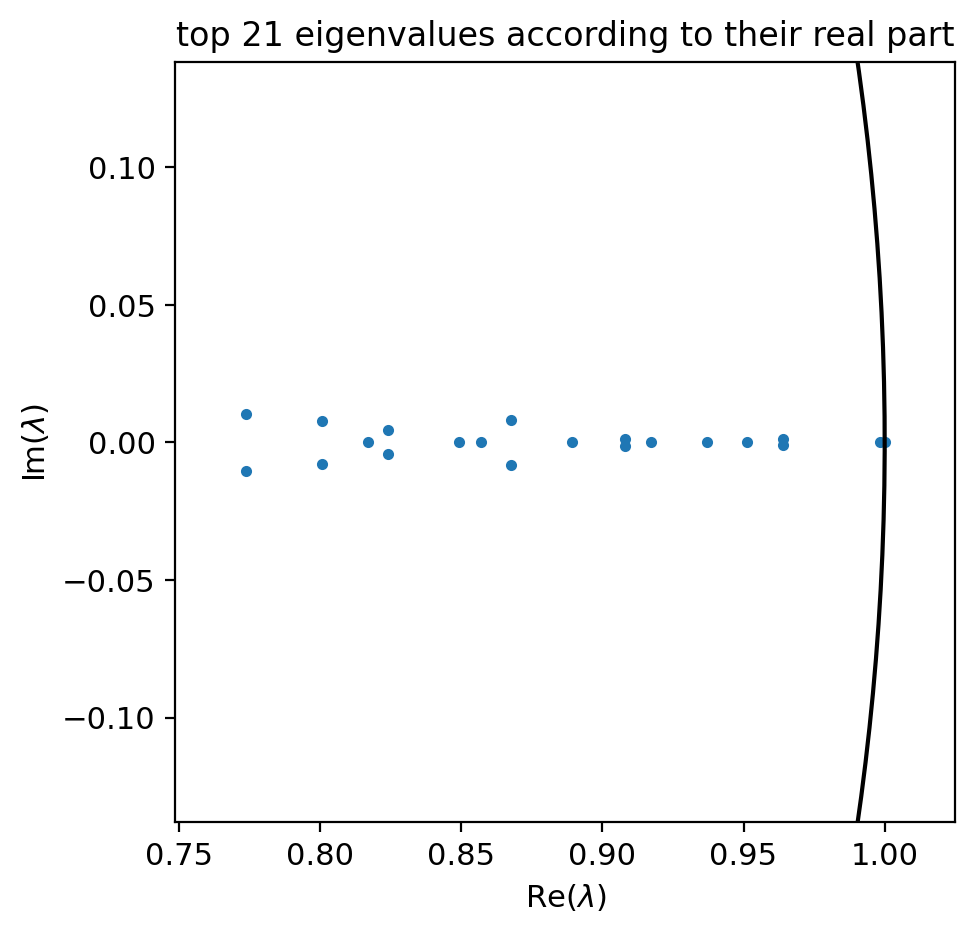

time: 11.3 s (started: 2022-08-04 16:42:44 +01:00)


In [12]:
combined_kernel = 0.5 * vk + 0.4 * wk + 0.1 * ck

from cellrank.tl.estimators import GPCCA

g = GPCCA(combined_kernel)

g.compute_schur(n_components=20)
g.plot_spectrum()

Computing `10` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:01:56)


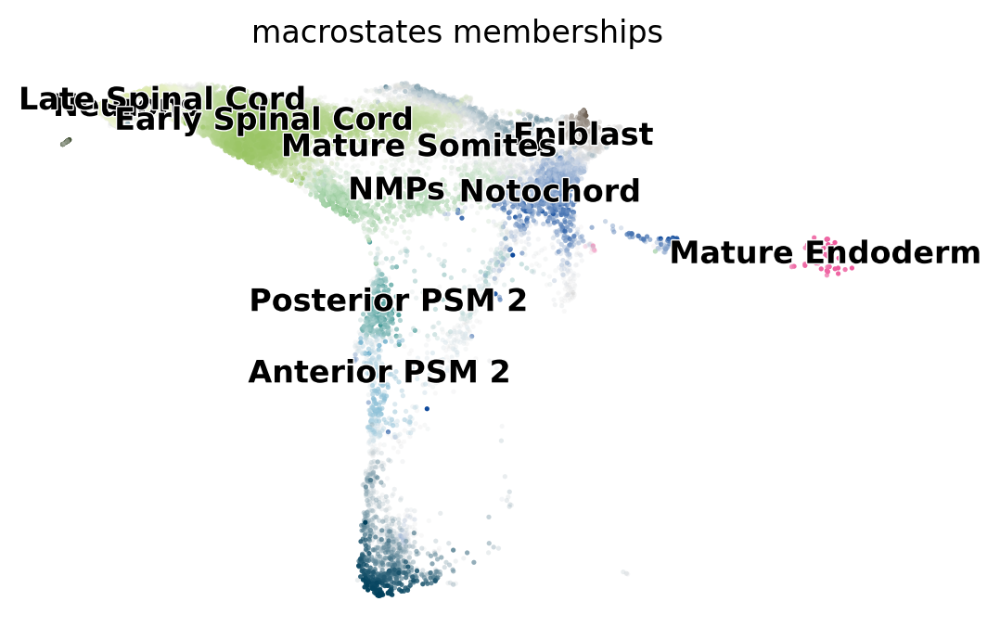

time: 2min (started: 2022-08-04 16:42:55 +01:00)


In [13]:
g.compute_macrostates(cluster_key="cluster", n_states=10)
g.plot_macrostates()

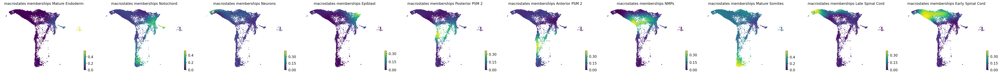

time: 3.93 s (started: 2022-08-04 16:44:56 +01:00)


In [14]:
g.plot_macrostates(same_plot=False)

In [15]:
g.compute_terminal_states()
adata_merge.obs['terminal_states'].value_counts()

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


Mature Somites       30
Late Spinal Cord     30
Early Spinal Cord    30
Name: terminal_states, dtype: int64

time: 25.9 ms (started: 2022-08-04 16:45:00 +01:00)


In [16]:
g.set_terminal_states_from_macrostates(names = ["Neurons", "Mature Endoderm", "Notochord",
                                                "Posterior PSM 2", "NMPs",
                                                "Anterior PSM 2", "Mature Somites", "Early Spinal Cord", "Late Spinal Cord"
                                               ]
                                      )

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
time: 35 ms (started: 2022-08-04 16:45:00 +01:00)


In [17]:
g.compute_absorption_probabilities()

Computing absorption probabilities


  0%|          | 0/9 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:01)
time: 1.96 s (started: 2022-08-04 16:45:00 +01:00)


In [18]:
def rename_clusters(names):
    names[names == 'Posterior PSM 1'] = 'Early Posterior PSM'
    names[names == 'Anterior PSM 1'] = 'Early Anterior PSM'
    names[names == 'Posterior PSM 2'] = 'Late Posterior PSM'
    names[names == 'Anterior PSM 2'] = 'Late Anterior PSM'
    return(names)

time: 978 µs (started: 2022-08-04 16:45:02 +01:00)


In [19]:
(adata_merge.obsm["terminal_states_memberships"]).names = rename_clusters((adata_merge.obsm["terminal_states_memberships"]).names)
(adata_merge.obsm["to_terminal_states"]).names = rename_clusters((adata_merge.obsm["to_terminal_states"]).names)

time: 16 ms (started: 2022-08-04 16:45:02 +01:00)


Solving TSP for `9` states


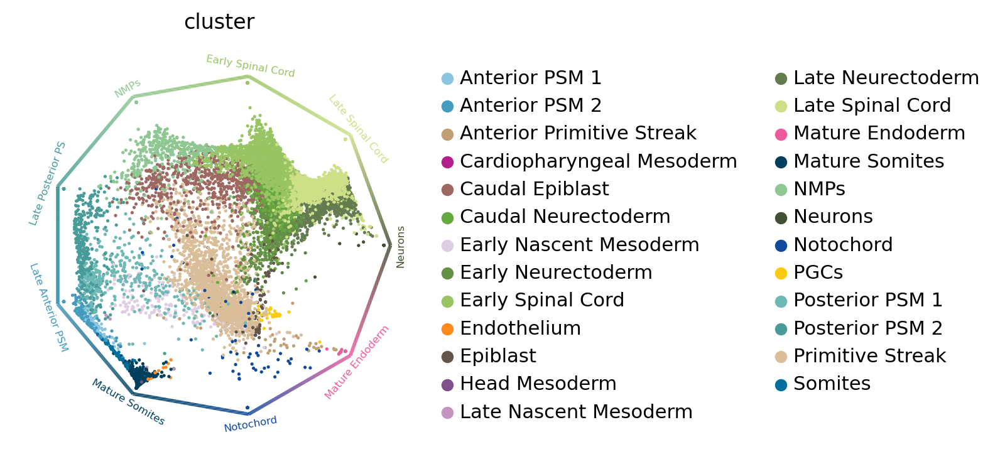

time: 1.3 s (started: 2022-08-04 16:45:02 +01:00)


In [20]:
cr.pl.circular_projection(adata_merge, keys="cluster", legend_loc="right", text_kwargs={'fontsize': 6}, label_distance=1.1)

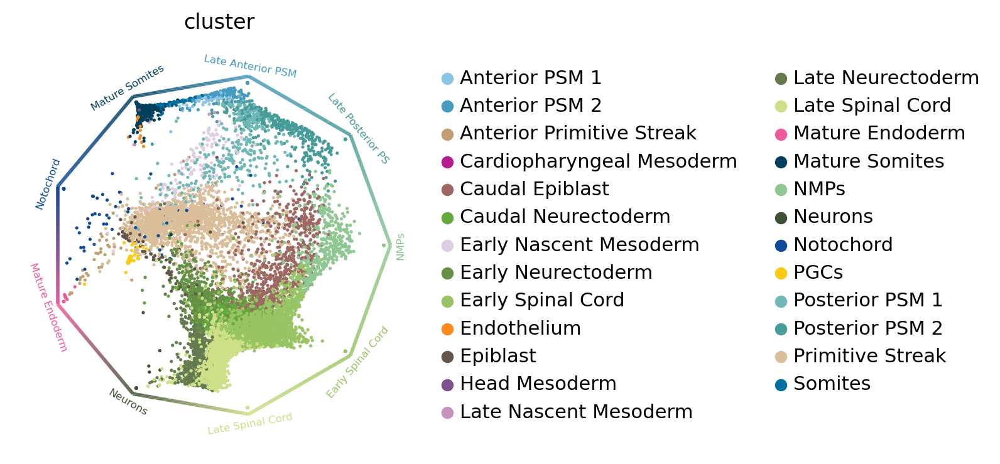

time: 2.86 s (started: 2022-08-04 16:45:03 +01:00)


In [21]:
lin_order = ['NMPs',
             'Late Posterior PS', 'Late Anterior PSM', 'Mature Somites',
             'Notochord', 'Mature Endoderm',
             'Neurons', 'Late Spinal Cord', 'Early Spinal Cord', 
            ]

cr.pl.circular_projection(adata_merge,
                          lineages = lin_order,
                          lineage_order = 'default',
                          keys="cluster",
                          legend_loc="right",
                          text_kwargs={'fontsize': 6},
                          label_distance=1.1
                         )
plt.savefig('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/final_plots/SuppFig8/D.pdf')

/hps/scratch/lsf_tmpdir/hl-codon-bm-06/ipykernel_3454579/2738497008.py:1: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  k = cr.tl.transition_matrix(


Computing transition matrix based on logits using `'deterministic'` mode
    Finish (0:01:30)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Projecting transition matrix onto `umap`
Adding `adata.obsm['T_fwd_umap']`
    Finish (0:00:07)


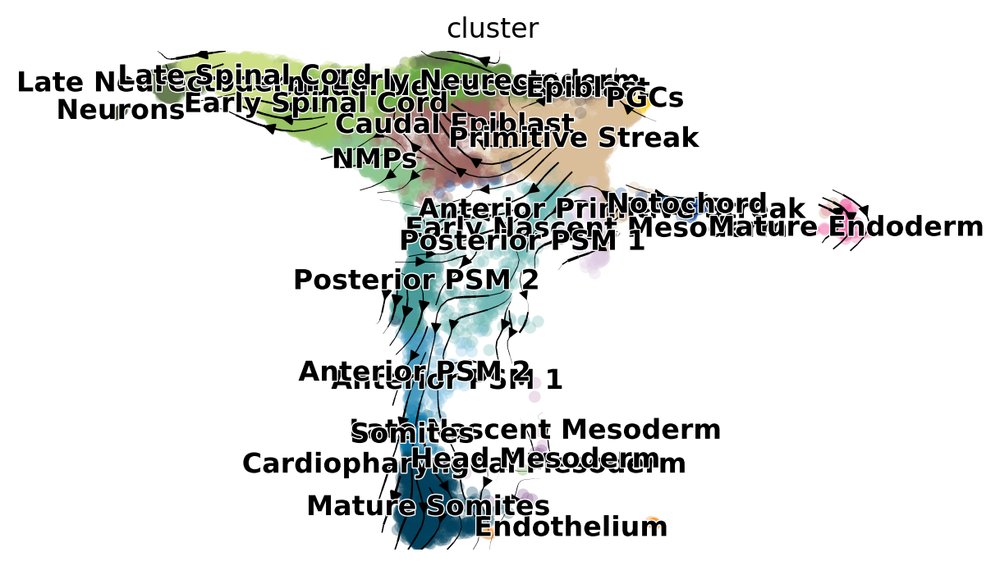

time: 1min 41s (started: 2022-06-30 11:39:52 +01:00)


In [109]:
k = cr.tl.transition_matrix(
    adata_merge, weight_connectivities=0.2, softmax_scale=4, show_progress_bar=False
)
k.compute_projection(basis="umap")
scv.pl.velocity_embedding_stream(adata_merge, vkey="T_fwd", basis="umap", color="cluster")

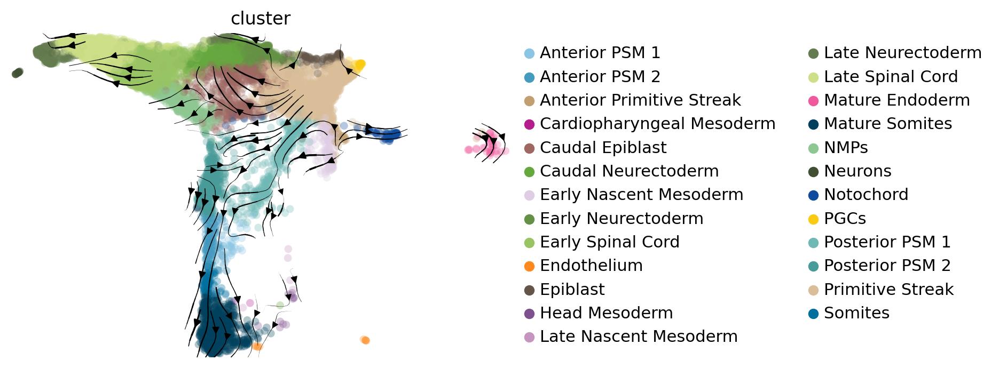

time: 3.62 s (started: 2022-06-30 11:41:34 +01:00)


In [110]:
scv.pl.velocity_embedding_stream(adata_merge, vkey="T_fwd", basis="umap", color="cluster", legend_loc='right')

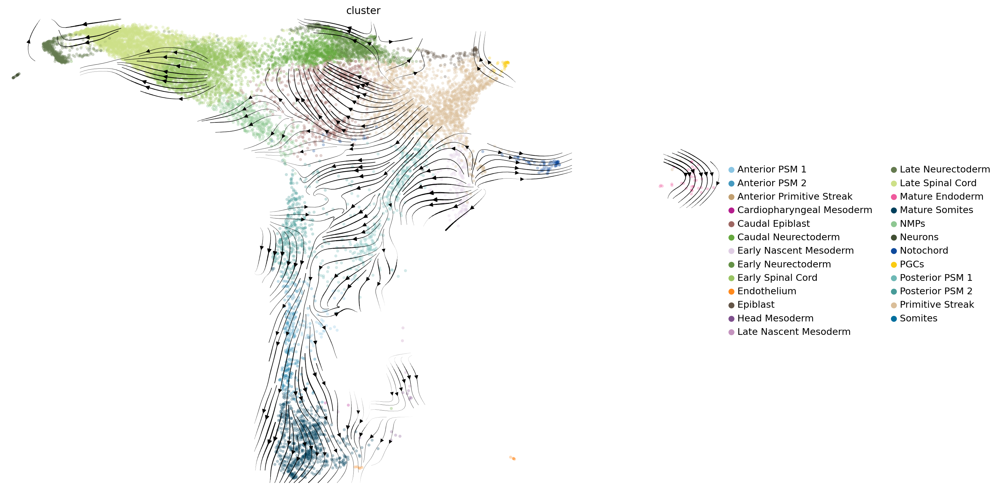

time: 12.9 s (started: 2022-06-30 11:41:37 +01:00)


In [111]:
fig, axs = plt.subplots(1,1, figsize = (15,10))

scv.pl.velocity_embedding_stream(adata_merge, vkey="T_fwd", basis="umap", color="cluster", size=50, ax = axs, density=5, legend_loc='right')

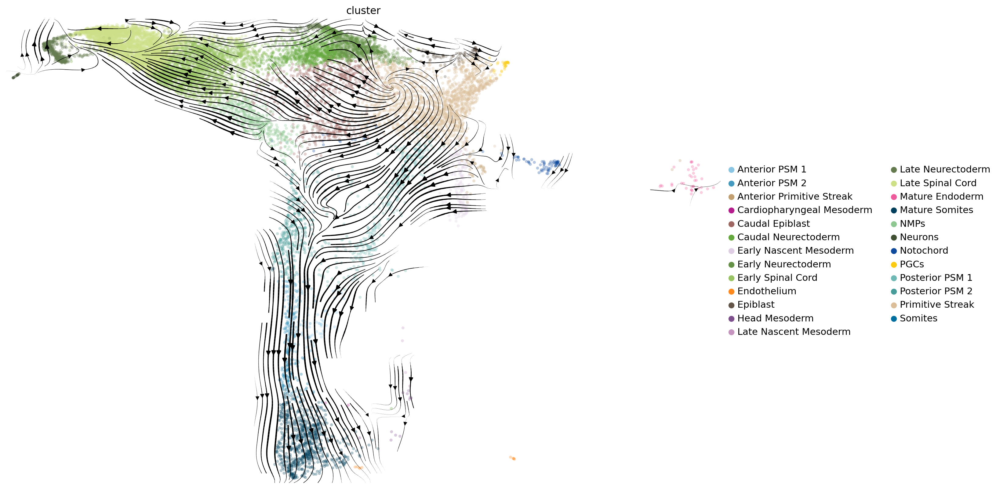

time: 19.2 s (started: 2022-06-30 11:59:53 +01:00)


In [131]:
fig, axs = plt.subplots(1,1, figsize = (15,10))

scv.pl.velocity_embedding_stream(adata_merge, basis="umap", color="cluster", size=50, ax = axs, density=5, legend_loc='right')

In [128]:
adata_merge_towrite = copy.deepcopy(adata_merge)
del adata_merge_towrite.obsm["terminal_states_memberships"]
del adata_merge_towrite.obsm["to_terminal_states"]
# 'schur_matrix_fwd', 'eigendecomposition_fwd', 'coarse_fwd', 'clusters_gradients_colors', 'terminal_states_colors', 'T_fwd_params'
del adata_merge_towrite.uns["T_fwd_params"]

time: 1.3 s (started: 2022-06-30 11:51:43 +01:00)


In [129]:
adata_merge_towrite.write("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/anndata_neural_cr.h5ad.gz", compression="gzip")

time: 1min 13s (started: 2022-06-30 11:51:47 +01:00)


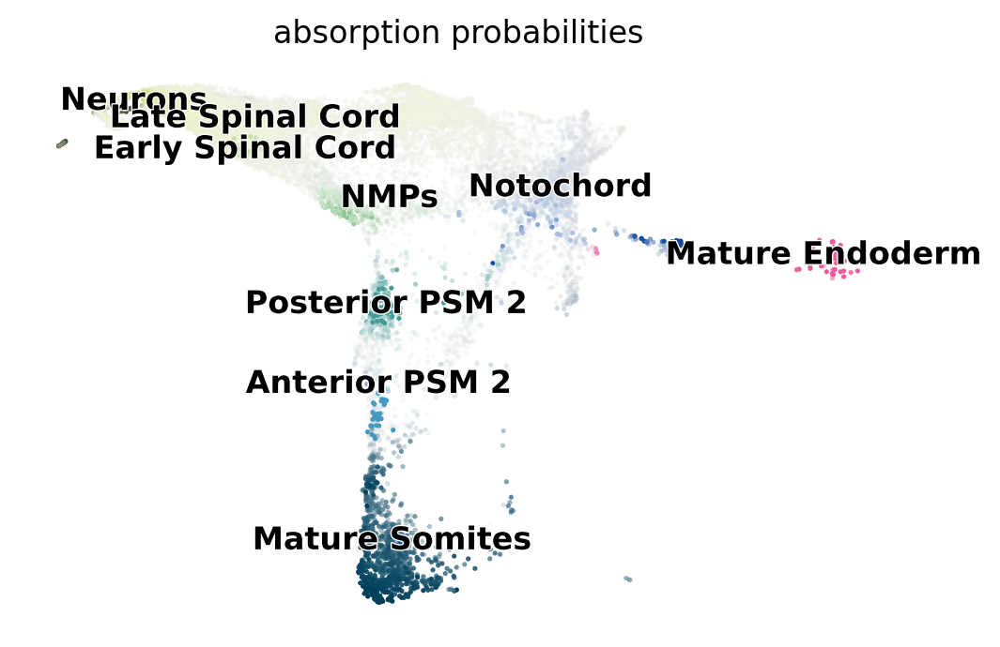

time: 8.27 s (started: 2022-06-30 12:01:02 +01:00)


In [132]:
g.plot_absorption_probabilities()

In [39]:
from scipy.io import mmwrite

time: 55.1 ms (started: 2022-04-26 17:43:07 +01:00)


In [40]:
mmwrite("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/transition_matrix_neural.mtx", g.transition_matrix)

time: 7.84 s (started: 2022-04-26 17:43:11 +01:00)


In [41]:
g.adata.obs.to_csv("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/cellrank_meta_neural.csv")

time: 446 ms (started: 2022-04-26 17:43:19 +01:00)
